# Рекомендация исполнителей для выполнения контрактов на закупки с учетом бюджета и времени выполнения контракта

**Цели работы:**
1. Построить модель рекомендации исполнителей для выполнения контрактов на закупки с учетом бюджета и времени выполнения контракта
2. Проверить качество правильного предсказания модели на тестовой выборке

**Задачи работы:**
Так как перед нами стоит задача рекомендации с помощью графовых нейронных сетей (GNN), необходимо построить ориентированный граф. Для этого нужно:
1. Собрать данные с сайтов zakupki.kontur.ru и companies.rbc.ru
2. Выполнить предобработку данных
3. Построить ориентированный граф
4. Разделить исходный набор данных на тестовую и обучающую выборки
5. Построить модель link prediction
6. Обучить модель на данных обучающей выборки
7. Оценить качество модели с помощью тестовой выборки
8. Создать рекомендательную систему
9. Сделать выводы

**Ожидаемый результат:** \
Модель, которая может с высокой вероятностью рекомендовать исполнителя для выполнения контракта

Импортируем все необходимые библиотеки

In [18]:
import requests
from bs4 import BeautifulSoup
import re
import pandas as pd
import os
from time import sleep
from tqdm import tqdm
from fake_useragent import UserAgent
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import dgl
import torch
import torch.nn as nn
import itertools
import torch.nn.functional as F
from sklearn.preprocessing import StandardScaler
from dgl.nn import SAGEConv
import dgl.function as fn
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import f1_score
from sklearn.preprocessing import OneHotEncoder

## Сбор данных

В первую очередь соберем из названий файлов ИНН поставщиков и номера контрактов.

In [19]:
files1 = os.listdir('D:/Курсовая работа/data/протоколы_ГосЗакупки')
files2 = os.listdir('D:/Курсовая работа/data/протоколы_ГосЗакупки_2')
files = files1 + files2

In [20]:
tin_number = [re.findall(r'\d+_\d+', file)[0] for file in files if len(re.findall(r'\d+_\d+', file)) > 0]
tin = [int(re.findall(r'\d+', i)[0]) for i in tin_number]
num = [int(re.findall(r'\d+', i)[1]) for i in tin_number]

In [21]:
dict_tin_num = {'ИНН поставщика': tin, 'Номер закупки': num}
contract_df = pd.DataFrame(data = dict_tin_num)

In [22]:
contract_df = contract_df[contract_df['ИНН поставщика'].astype(str).str.len() > 9]

In [23]:
contract_df = contract_df.drop_duplicates()

In [24]:
contract_df

,ИНН поставщика,Номер закупки
0,1106014140,32110960997
1,1433000147,32009437716
2,1434031363,32110980912
3,1435028701,32111010570
4,1435028701,32211077961
...,...,...
3381,7805018099,32009797834
3382,7805018099,32009797925
3383,7805018099,32111000521
3384,7805018099,32111000659


## Парсинг РБК по ИНН поставщика

Нам понадобятся такие данные о поставщике, как уставной капитал, выручка и темп прироста. Соберем их с сайта companies.rbc.ru

In [25]:
ua = UserAgent(browsers=['chrome'])

In [26]:
def parsing_tin_rbk(num_tin, df_tin):
    url_tin = f'https://companies.rbc.ru/search/?query={num_tin}'
    ua = UserAgent(browsers=['chrome'])
    headers = {"User-Agent": ua.random}
    
    response_tin = requests.get(url_tin, headers=headers)
    soup = BeautifulSoup(response_tin.text, "lxml")
    
    # Уставной капитал поставщика
    authorized_capital = soup.find("div", class_="company-card__block")
    authorized_capital = authorized_capital.find_all("p", class_="company-card__info")[1].text
    authorized_capital = re.findall(r'\d+', authorized_capital)
    
    if authorized_capital != []:
        authorized_capital[-2] = authorized_capital[-2]+'.'+authorized_capital[-1]
        authorized_capital = authorized_capital[:-1]
        authorized_capital = float("".join(authorized_capital))
    else:
        authorized_capital = None
    
    # Выручка
    revenue = soup.find_all("p", class_="company-card__info")[-2].text
    revenue = re.findall(r'\d+', revenue)
    
    if revenue != []:
        revenue[-2] = revenue[-2]+'.'+revenue[-1]
        revenue = revenue[:-1]
        revenue = float("".join(revenue))
    else:
        revenue = None
    
    # Темп прироста (выручки)
    growth_rate = soup.find_all("p", class_="company-card__info")[-1].text
    growth_rate = re.findall(r'\d+', growth_rate)
    
    if growth_rate != []:
        growth_rate = growth_rate[0]+'.'+growth_rate[1]
        growth_rate = float(growth_rate)
    else:
        growth_rate = None
    
    
    dict_data = {'ИНН поставщика': [num_tin], 'Уставной капитал': [authorized_capital], 'Выручка': [revenue], 
                 'Темп прироста %': [growth_rate]}
    
    dict_data = pd.DataFrame(dict_data)
    
    df_tin = pd.concat([df_tin, dict_data], ignore_index=True)
    
    return df_tin

In [27]:
df_tin = pd.DataFrame(columns=['ИНН поставщика', 'Уставной капитал', 'Выручка', 'Темп прироста %'])

for num_tin in tqdm(contract_df['ИНН поставщика'].unique()):
    df_tin = parsing_tin_rbk(num_tin, df_tin)
    sleep(0.001)

100%|████████████████████████████████████████████████████████████████████████████████| 317/317 [01:40<00:00,  3.15it/s]


**Время**, затраченное на сбор информации с сайта РБК: 1 мин. 40 сек.

Сравним количество строк в датафрейме с фичами для исполнителей с исходным датафреймом:

In [30]:
df_tin

,ИНН поставщика,Уставной капитал,Выручка,Темп прироста %
0,1106014140,5.758304e+09,4.989540e+11,91.49
1,1433000147,3.682483e+09,2.617680e+11,81.11
2,1434031363,8.616038e+10,8.017448e+10,3.58
3,1435028701,2.063756e+10,3.257850e+10,6.17
4,1435152770,2.112380e+09,3.242493e+10,41.50
...,...,...,...,...
312,7734135124,1.582867e+10,5.151016e+10,36.40
313,7736655834,3.000000e+05,3.625644e+10,NaN
314,7804069580,1.000000e+05,4.091390e+10,8.94
315,7805018099,2.073606e+10,8.188798e+10,1.87


In [31]:
contract_df['ИНН поставщика'].nunique()

317

Количество строк совпадает.

## Парсинг сайта zakupki.kontur.ru по номеру контракта

Также нам необходима информация по контракту. Исходя из темы, получим цену контракта и время его выполнения. Для построения графа нужно собрать ИНН заказчиков.

In [32]:
def parsing_zakupki_kontur(num_contract, df):
    url_p = f'https://zakupki.kontur.ru/{num_contract}'
    headers = {"User-Agent": ua.random}
    response_p = requests.get(url_p, headers=headers)
    soup_p = BeautifulSoup(response_p.text, "lxml")
    
    # Цена контракта
    price = soup_p.find("div", class_="tender-named-values_value").text
    price = re.findall(r'\d+', price)
    
    if price != []:
        price[-2] = price[-2]+'.'+price[-1]
        price = price[:-1]
        price = float("".join(price))
    else:
        price = None
    
    # Дата размещения объявления
    date_start = soup_p.find("div", class_="purchase-description__publication-info").text
    date_start = re.findall(r'\d\d.\d\d.\d{4}', date_start)[0]
    
    # Дата размещения результатов
    dates_end = soup_p.find_all("div", class_="tender-block__title")
    date_end = None
    for i in dates_end:
        if i.find("span", class_="tender-block__title-info") != None:
            date_end = i.find("span", class_="tender-block__title-info").text
            date_end = re.findall(r'\d\d.\d\d.\d{4}', date_end)[0]
            
    # класс ОКПД2 
    okpd2 = None
    okved2 = None
    okpd2_okved2 = soup_p.find_all("div", class_="purchase-page__block tender-block")
    for i in okpd2_okved2:
        if i.find_all("p", class_="t-grey") != []:
            okpd2 = i.find_all("p", class_="t-grey")[0].text.split('.')[0]

    # ИНН заказчика
    if soup_p.find_all("div", class_="purchase-page__block tender-block tender-block_multi-lot") == []:
        inn_kpp = soup_p.find_all("div", class_="purchase-page__block tender-block")[1]
        inn_kpp = inn_kpp.find("div", class_="tender-named-values_value").text
        inn_p = re.findall(r'\d+', inn_kpp)[0]
        
    else:
        inn_kpp = soup_p.find_all("div", class_="purchase-page__block tender-block")[2]
        inn_kpp = inn_kpp.find("div", class_="tender-named-values_value").text
        inn_p = re.findall(r'\d+', inn_kpp)[0]

    
    dict_data = {'Номер закупки': [num_contract], 'ИНН заказчика': [inn_p], 'ОКПД2': [okpd2], 
                 'Дата размещения': [date_start], 'Дата окончания': [date_end], 'Цена': [price]}

    dict_data = pd.DataFrame(dict_data)

    df = pd.concat([df, dict_data], ignore_index=True)
    
    return df

In [33]:
df = pd.DataFrame(columns=['Номер закупки', 'ИНН заказчика', 'ОКПД2', 
                           'Дата размещения', 'Дата окончания', 'Цена'])

for num_contract in tqdm(contract_df['Номер закупки'].unique()):
    df = parsing_zakupki_kontur(num_contract, df)

100%|██████████████████████████████████████████████████████████████████████████████| 2012/2012 [06:46<00:00,  4.95it/s]


**Время**, затраченное на сбор информации с сайта с закупками: 6 мин. 46 сек.

Чтобы получить время выполнения контракта (в днях), преобразуем колонки с датами в формат datetime64.

In [35]:
df['Дата размещения'] = pd.to_datetime(df['Дата размещения'])
df['Дата окончания'] = pd.to_datetime(df['Дата окончания'])

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2012 entries, 0 to 2011
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Номер закупки    2012 non-null   object        
 1   ИНН заказчика    2012 non-null   object        
 2   ОКПД2            2011 non-null   object        
 3   Дата размещения  2012 non-null   datetime64[ns]
 4   Дата окончания   2005 non-null   datetime64[ns]
 5   Цена             1992 non-null   float64       
dtypes: datetime64[ns](2), float64(1), object(3)
memory usage: 94.4+ KB


In [37]:
df['Время выполнения'] = (df['Дата окончания'] - df['Дата размещения']) / np.timedelta64 ( 1 , 'D')
df = df.drop(['Дата размещения', 'Дата окончания'], axis=1)
df.head()

,Номер закупки,ИНН заказчика,ОКПД2,Цена,Время выполнения
0,32110960997,1106024691,06,3.017975e+08,0.0
1,32009437716,1435326056,19,4.775860e+08,29.0
2,32110980912,2536038419,35,6.000000e+06,4.0
3,32111010570,1435142972,33,2.408280e+05,0.0
4,32211077961,1435205823,35,1.181590e+07,0.0


Соеденим два полученых датасета в один так, чтобы каждая строка нового датасета предоставляла информацию для конкретного контракта. Описание полученного датасета:
1. ИНН поставщика
2. Уставной капитал - уставной капитал исполнителя (руб.)
3. Выручка - выручка исполнителя (руб.)
4. Темп прироста % - темп прироста выручки (%)
5. Номер закупки (номер контракта)
6. ИНН заказчика
7. ОКПД2 - "Общероссийский Классификатор Продукции по видам экономической Деятельности"
8. Цена - цена контракта (руб.)
9. Время выполнения - время выполнение контракта (в днях)

In [38]:
final_dataset = df_tin.merge(contract_df, how='inner', left_on='ИНН поставщика', right_on='ИНН поставщика')\
    .merge(df, how='inner', left_on='Номер закупки', right_on='Номер закупки')
final_dataset

,ИНН поставщика,Уставной капитал,Выручка,Темп прироста %,Номер закупки,ИНН заказчика,ОКПД2,Цена,Время выполнения
0,1106014140,5.758304e+09,4.989540e+11,91.49,32110960997,1106024691,06,3.017975e+08,0.0
1,1433000147,3.682483e+09,2.617680e+11,81.11,32009437716,1435326056,19,4.775860e+08,29.0
2,1434031363,8.616038e+10,8.017448e+10,3.58,32110980912,2536038419,35,6.000000e+06,4.0
3,1434031363,8.616038e+10,8.017448e+10,3.58,32110981250,2706015700,35,8.171000e+05,0.0
4,1434031363,8.616038e+10,8.017448e+10,3.58,32111002641,2706028690,35,1.451776e+05,0.0
...,...,...,...,...,...,...,...,...,...
2047,7805018099,2.073606e+10,8.188798e+10,1.87,32009797834,6950152108,49,3.000000e+06,36.0
2048,7805018099,2.073606e+10,8.188798e+10,1.87,32009797925,6950152108,49,1.400000e+07,38.0
2049,7805018099,2.073606e+10,8.188798e+10,1.87,32111000521,6950152108,49,1.377490e+07,1.0
2050,7805018099,2.073606e+10,8.188798e+10,1.87,32111000659,6950152108,49,2.587840e+06,1.0


Посмотрим на пропущенные значения в датасете:

In [42]:
final_dataset.isna().sum()

ИНН поставщика       0
Уставной капитал    17
Выручка              0
Темп прироста %     17
Номер закупки        0
ИНН заказчика        0
ОКПД2                1
Цена                20
Время выполнения     7
dtype: int64

In [40]:
final_dataset['ОКПД2'].unique()

array(['06', '19', '35', '33', '52', '46', '10', '29', '45', '22', '43',
       '20', '28', '11', '05', '30', '49', None, '71', '68', '55', '62',
       '80', '23', '27', '42', '47', '26', '36', '37', '02', '07', '72',
       '31', '21', '24', '25', '77', '61', '74', '12', '32', '13', '01',
       '82', '17', '51', '85', '95', '58', '84', '41', '81', '90', '63',
       '65', '69', '93', '79', '70', '73', '14', '53', '64', '94', '86'],
      dtype=object)

Сначала посмотрим, у какого контракта пропущено значение ОКПД2.

In [43]:
final_dataset[final_dataset['ОКПД2'].isna() == 1]

,ИНН поставщика,Уставной капитал,Выручка,Темп прироста %,Номер закупки,ИНН заказчика,ОКПД2,Цена,Время выполнения
141,2308091759,4070260.0,3.833145e+10,11.36,32109952538,2302039833,None,NaN,0.0


Посмотрев на название данной контрзакупки, можно понять, что ОКПД связан с электроэнергией, поэтому добавим вручную в этот столбец значение 35, что означает обеспечение электрической энергией, газом и паром.

In [45]:
final_dataset = final_dataset.replace({'ОКПД2': {None: '35'}})

Посмотрим на распределения остальных колонок, где есть пропущенные значения.

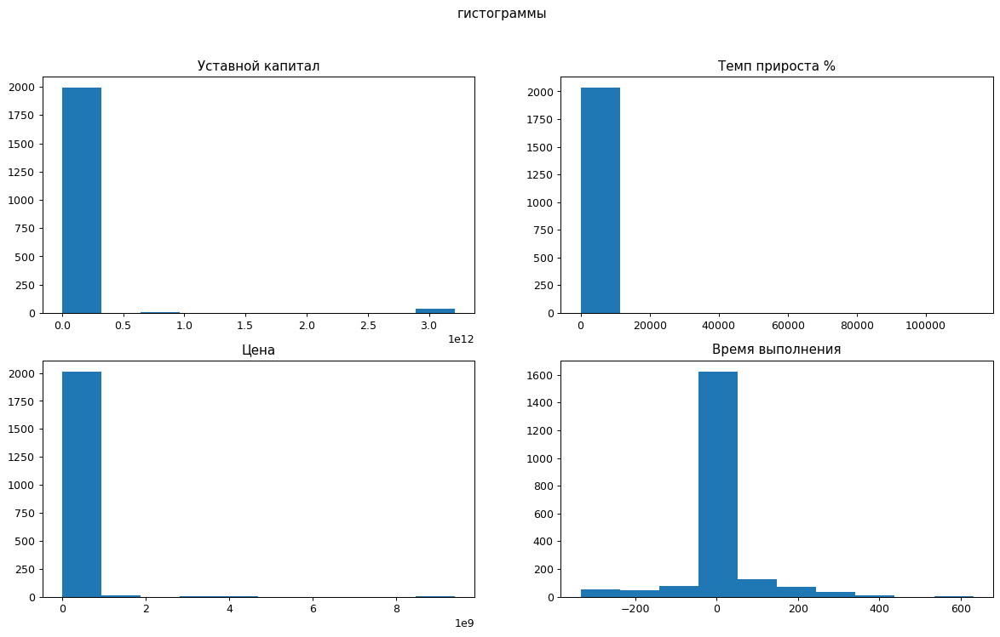

In [46]:
fig, axs = plt.subplots(nrows= 2 , ncols= 2, figsize=(16, 9), dpi=90)

fig. suptitle('гистограммы')

axs[0, 0].hist(final_dataset['Уставной капитал'])
axs[0, 0].set_title('Уставной капитал')
axs[0, 1].hist(final_dataset['Темп прироста %'])
axs[0, 1].set_title('Темп прироста %')
axs[1, 0].hist(final_dataset['Цена'])
axs[1, 0].set_title('Цена')
axs[1, 1].hist(final_dataset['Время выполнения'])
axs[1, 1].set_title('Время выполнения');

In [47]:
final_dataset.describe()

,Уставной капитал,Выручка,Темп прироста %,Цена,Время выполнения
count,2.035000e+03,2.052000e+03,2035.000000,2.032000e+03,2045.000000
mean,7.144983e+10,1.542873e+11,138.186167,4.482990e+07,8.016626
std,4.315239e+11,4.399752e+11,3563.490171,3.584220e+08,86.259205
min,9.000000e+03,0.000000e+00,0.300000,1.100000e-01,-334.000000
25%,4.331860e+06,3.993788e+10,8.450000,4.000000e+05,0.000000
50%,1.500000e+08,6.063971e+10,16.230000,1.443309e+06,0.000000
75%,4.142657e+09,1.139242e+11,33.550000,7.499762e+06,14.000000
max,3.212182e+12,7.593832e+12,113716.580000,9.405000e+09,631.000000


По графику с гистограммами можно заметить большие выбросы в колонках "Уставной капитал", "Цена" и "Темп прироста %", что искажает математическое ожидание, поэтому пропущенные значения в этих колонках мы заменим медианой, а в колонке "Время выполнения" - средним.

In [48]:
final_dataset['Время выполнения'] = final_dataset['Время выполнения']\
    .fillna(final_dataset['Время выполнения'].mean())

final_dataset[['Уставной капитал', 'Цена', 'Темп прироста %']] = final_dataset[['Уставной капитал', 'Цена', 'Темп прироста %']]\
    .fillna(final_dataset[['Уставной капитал', 'Цена', 'Темп прироста %']].median())

In [49]:
final_dataset

,ИНН поставщика,Уставной капитал,Выручка,Темп прироста %,Номер закупки,ИНН заказчика,ОКПД2,Цена,Время выполнения
0,1106014140,5.758304e+09,4.989540e+11,91.49,32110960997,1106024691,06,3.017975e+08,0.0
1,1433000147,3.682483e+09,2.617680e+11,81.11,32009437716,1435326056,19,4.775860e+08,29.0
2,1434031363,8.616038e+10,8.017448e+10,3.58,32110980912,2536038419,35,6.000000e+06,4.0
3,1434031363,8.616038e+10,8.017448e+10,3.58,32110981250,2706015700,35,8.171000e+05,0.0
4,1434031363,8.616038e+10,8.017448e+10,3.58,32111002641,2706028690,35,1.451776e+05,0.0
...,...,...,...,...,...,...,...,...,...
2047,7805018099,2.073606e+10,8.188798e+10,1.87,32009797834,6950152108,49,3.000000e+06,36.0
2048,7805018099,2.073606e+10,8.188798e+10,1.87,32009797925,6950152108,49,1.400000e+07,38.0
2049,7805018099,2.073606e+10,8.188798e+10,1.87,32111000521,6950152108,49,1.377490e+07,1.0
2050,7805018099,2.073606e+10,8.188798e+10,1.87,32111000659,6950152108,49,2.587840e+06,1.0


In [50]:
final_dataset.isna().sum()

ИНН поставщика      0
Уставной капитал    0
Выручка             0
Темп прироста %     0
Номер закупки       0
ИНН заказчика       0
ОКПД2               0
Цена                0
Время выполнения    0
dtype: int64

## Построение графа

Вершинами графа будут заказчики и исполнители, а ребрами - связи между ними. Граф будет ориентированным (от заказчика к исполителю).

In [51]:
final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2052 entries, 0 to 2051
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ИНН поставщика    2052 non-null   object 
 1   Уставной капитал  2052 non-null   float64
 2   Выручка           2052 non-null   float64
 3   Темп прироста %   2052 non-null   float64
 4   Номер закупки     2052 non-null   object 
 5   ИНН заказчика     2052 non-null   object 
 6   ОКПД2             2052 non-null   object 
 7   Цена              2052 non-null   float64
 8   Время выполнения  2052 non-null   float64
dtypes: float64(5), object(4)
memory usage: 160.3+ KB


Чтобы посмотреть, есть ли такие вершины, которые являются одновременно и заказчиками и поставщиками, преобразуем колонки с ИНН в формат int64:

In [52]:
final_dataset['ИНН заказчика'] = pd.to_numeric(final_dataset['ИНН заказчика'])
final_dataset['ИНН поставщика'] = pd.to_numeric(final_dataset['ИНН поставщика'])
final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2052 entries, 0 to 2051
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ИНН поставщика    2052 non-null   int64  
 1   Уставной капитал  2052 non-null   float64
 2   Выручка           2052 non-null   float64
 3   Темп прироста %   2052 non-null   float64
 4   Номер закупки     2052 non-null   object 
 5   ИНН заказчика     2052 non-null   int64  
 6   ОКПД2             2052 non-null   object 
 7   Цена              2052 non-null   float64
 8   Время выполнения  2052 non-null   float64
dtypes: float64(5), int64(2), object(2)
memory usage: 160.3+ KB


Теперь проверим, существуют ли такие вершины:

In [53]:
set(final_dataset['ИНН поставщика']) & set(final_dataset['ИНН заказчика'])

{2460069527,
 5009033419,
 5260200603,
 5612042824,
 6829012680,
 7606053324,
 7701984274,
 7704784450,
 7705035012,
 7720261827,
 7734003657,
 7734135124,
 7802312751,
 7810814522,
 9705001313}

Для начала определим вершины нашего графа:

In [54]:
df_nodes = pd.DataFrame(set(final_dataset['ИНН поставщика']) | set(final_dataset['ИНН заказчика']), columns = ['ИНН'])
df_nodes

,ИНН
0,6670381056
1,3234013184
2,1644040195
3,2536038419
4,4217102358
...,...
1018,7707279342
1019,3128115184
1020,7805018099
1021,7709007859


Используем функцию nodes_feat, чтобы добавить фичи нашим вершинам.

In [55]:
def nodes_feat(df_nodes, df):
    for tin in tqdm(df_nodes['ИНН']):
        df_contract = df[df['ИНН поставщика'] == tin]
        df_contract = pd.concat([df_contract, df[df['ИНН заказчика'] == tin]])
        
        # Добавим связи заказчиков с исполнителями
        list_test = df_contract[df_contract['ИНН поставщика']  != tin]['ИНН поставщика'].unique().tolist()
        
        # Чтобы добавить ребра как списки
        class edges(object):
            def __init__(self, li_obj):
                self.obj = li_obj

        if tin in df_contract['ИНН заказчика'].unique():
            df_nodes.loc[df_nodes['ИНН'] == tin, 'Ребра'] = edges(list_test)
        else:
            df_nodes.loc[df_nodes['ИНН'] == tin, 'Ребра'] = 0
        
        # Добавим фичи для вершин-исполнителей
        if tin in df_contract['ИНН поставщика'].unique():
            df_nodes.loc[df_nodes['ИНН'] == tin, 'Уставной капитал'] = df_contract['Уставной капитал'].unique()[0]
            df_nodes.loc[df_nodes['ИНН'] == tin, 'Выручка'] = df_contract['Выручка'].unique()[0]
            df_nodes.loc[df_nodes['ИНН'] == tin, 'Темп прироста %'] = df_contract['Темп прироста %'].unique()[0]


        # Добавим фичи по контрактам
        df_nodes.loc[df_nodes['ИНН'] == tin, 'ОКПД2'] = df_contract['ОКПД2'].mode()[0]
        # добавим самый часто повторяющийся номер ОКПД2
        
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Цена sum'] = df_contract['Цена'].sum()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Цена mean'] = df_contract['Цена'].mean()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Цена max'] = df_contract['Цена'].max()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Цена min'] = df_contract['Цена'].min()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Цена median'] = df_contract['Цена'].median()
        
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Время sum'] = df_contract['Время выполнения'].sum()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Время mean'] = df_contract['Время выполнения'].mean()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Время max'] = df_contract['Время выполнения'].max()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Время min'] = df_contract['Время выполнения'].min()
        df_nodes.loc[df_nodes['ИНН'] == tin, 'Время median'] = df_contract['Время выполнения'].median()
        
       # Добавим dummy колонки с принадлежностью к исполнителям и заказчикам
        if tin in df_contract['ИНН поставщика'].unique():
            df_nodes.loc[df_nodes['ИНН'] == tin, 'Поставщик'] = 1
        if tin in df_contract['ИНН заказчика'].unique():
            df_nodes.loc[df_nodes['ИНН'] == tin, 'Заказчик'] = 1
        
nodes_feat(df_nodes, final_dataset)

100%|██████████████████████████████████████████████████████████████████████████████| 1023/1023 [00:13<00:00, 77.23it/s]


**Время**, затраченное на добавление фичей - 13 сек.

Мы добавили две dummy-колонки, так как существуют вершины, которые являются и заказчиками и поставщиками.
Так как ИНН для вершин должны быть уникальны, то для фичей "Цена" и "Время выполнения" мы посчитали их сумму, среднее, максималньное, минимальное и медианное значения, чтобы не потерять информацию для разных контрактов.

In [57]:
# Заменим пропущенные значения на 0 и добавим списки в колонку "Ребра"
df_nodes = df_nodes.fillna(0)
df_nodes['Ребра'] = df_nodes['Ребра'].apply(lambda x: [] if x == 0 else x.obj)
df_nodes

,ИНН,Ребра,Уставной капитал,Выручка,Темп прироста %,ОКПД2,Цена sum,Цена mean,Цена max,Цена min,Цена median,Время sum,Время mean,Время max,Время min,Время median,Поставщик,Заказчик
0,6670381056,[],4.000000e+04,6.138186e+10,51.70,47,1.693300e+05,1.693300e+05,1.693300e+05,1.693300e+05,1.693300e+05,0.0,0.000000,0.0,0.0,0.0,1.0,0.0
1,3234013184,[7718538045],0.000000e+00,0.000000e+00,0.00,21,3.425140e+06,5.708567e+05,8.603560e+05,4.263920e+05,4.280000e+05,1.0,0.166667,1.0,0.0,0.0,0.0,1.0
2,1644040195,[],3.496294e+09,9.202206e+10,26.38,19,5.934629e+07,3.123489e+06,4.266100e+07,1.800000e+05,6.990000e+05,269.0,14.157895,143.0,0.0,0.0,1.0,0.0
3,2536038419,[1434031363],0.000000e+00,0.000000e+00,0.00,35,6.873196e+06,3.436598e+06,6.000000e+06,8.731959e+05,3.436598e+06,5.0,2.500000,4.0,1.0,2.5,0.0,1.0
4,4217102358,[],4.462747e+09,9.753298e+10,52.05,19,1.206000e+09,1.206000e+09,1.206000e+09,1.206000e+09,1.206000e+09,1.0,1.000000,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,7707279342,[],5.020473e+08,5.307175e+09,5.39,77,9.955291e+06,9.955291e+06,9.955291e+06,9.955291e+06,9.955291e+06,0.0,0.000000,0.0,0.0,0.0,1.0,0.0
1019,3128115184,[3123050159],0.000000e+00,0.000000e+00,0.00,35,1.793195e+06,1.793195e+06,1.793195e+06,1.793195e+06,1.793195e+06,0.0,0.000000,0.0,0.0,0.0,0.0,1.0
1020,7805018099,[],2.073606e+10,8.188798e+10,1.87,49,3.336274e+07,8.340686e+06,1.400000e+07,2.587840e+06,8.387452e+06,76.0,19.000000,38.0,1.0,18.5,1.0,0.0
1021,7709007859,[7720518494],0.000000e+00,0.000000e+00,0.00,35,2.738999e+06,5.477998e+05,1.432500e+06,2.000000e+05,3.209118e+05,0.0,0.000000,0.0,0.0,0.0,0.0,1.0


В колонке "Ребра" у нас хранятся вершины исполнителей контракта, с которыми связан наш заказчик. Если строка равна пустому списку, это значит, что данная вершина является поставщиком.

Теперь столбец с классом ОКПД2 преобразуем с помощью OneHotEncoder из sklearn:

In [76]:
onehotencoder = OneHotEncoder()
okpd2_feat = onehotencoder.fit_transform(df_nodes[['ОКПД2']])
okpd2_feat = pd.DataFrame(okpd2_feat.toarray(), columns=onehotencoder.categories_[0])
okpd2_feat

,01,02,05,06,07,10,11,12,13,14,...,71,72,73,74,77,79,80,82,85,93
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1021,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [84]:
df_nodes = pd.merge(df_nodes, okpd2_feat, left_index=True, right_index=True).drop('ОКПД2', axis=1)
df_nodes

,ИНН,Ребра,Уставной капитал,Выручка,Темп прироста %,Цена sum,Цена mean,Цена max,Цена min,Цена median,...,71,72,73,74,77,79,80,82,85,93
0,6670381056,[],4.000000e+04,6.138186e+10,51.70,1.693300e+05,1.693300e+05,1.693300e+05,1.693300e+05,1.693300e+05,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3234013184,[7718538045],0.000000e+00,0.000000e+00,0.00,3.425140e+06,5.708567e+05,8.603560e+05,4.263920e+05,4.280000e+05,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1644040195,[],3.496294e+09,9.202206e+10,26.38,5.934629e+07,3.123489e+06,4.266100e+07,1.800000e+05,6.990000e+05,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2536038419,[1434031363],0.000000e+00,0.000000e+00,0.00,6.873196e+06,3.436598e+06,6.000000e+06,8.731959e+05,3.436598e+06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4217102358,[],4.462747e+09,9.753298e+10,52.05,1.206000e+09,1.206000e+09,1.206000e+09,1.206000e+09,1.206000e+09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,7707279342,[],5.020473e+08,5.307175e+09,5.39,9.955291e+06,9.955291e+06,9.955291e+06,9.955291e+06,9.955291e+06,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1019,3128115184,[3123050159],0.000000e+00,0.000000e+00,0.00,1.793195e+06,1.793195e+06,1.793195e+06,1.793195e+06,1.793195e+06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1020,7805018099,[],2.073606e+10,8.188798e+10,1.87,3.336274e+07,8.340686e+06,1.400000e+07,2.587840e+06,8.387452e+06,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1021,7709007859,[7720518494],0.000000e+00,0.000000e+00,0.00,2.738999e+06,5.477998e+05,1.432500e+06,2.000000e+05,3.209118e+05,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [85]:
df_nodes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1023 entries, 0 to 1022
Data columns (total 73 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ИНН               1023 non-null   int64  
 1   Ребра             1023 non-null   object 
 2   Уставной капитал  1023 non-null   float64
 3   Выручка           1023 non-null   float64
 4   Темп прироста %   1023 non-null   float64
 5   Цена sum          1023 non-null   float64
 6   Цена mean         1023 non-null   float64
 7   Цена max          1023 non-null   float64
 8   Цена min          1023 non-null   float64
 9   Цена median       1023 non-null   float64
 10  Время sum         1023 non-null   float64
 11  Время mean        1023 non-null   float64
 12  Время max         1023 non-null   float64
 13  Время min         1023 non-null   float64
 14  Время median      1023 non-null   float64
 15  Поставщик         1023 non-null   float64
 16  Заказчик          1023 non-null   float64


**Идея** \
Данный датасет с фичами предназначен для вершин графа, при этом ребра графа не имеют ни названий, ни фичей. Далее мы будем рассматривать модели, которые работают только с фичами вершин, но модели, учитывающие ребра, тоже имеют место быть. В таком случае фичи, показывающие информацию о контрактах, такие как "Цена", "Время исполнения" и "ОКПД2", были бы фичами для ребер и не нуждались бы в дополнительном преобразовании.

Стандартизируем наши фичи:

In [86]:
features = StandardScaler().fit_transform(np.array(df_nodes.copy().drop(['ИНН', 'Ребра'], axis=1))).astype(np.float32)
features.shape

(1023, 71)

Создадим ориентированный граф при помощи библиотеки networkx:

In [87]:
G = nx.DiGraph()
G.add_nodes_from(df_nodes['ИНН'])
for i in range(len(df_nodes)):
    for j in df_nodes['Ребра'][i]:
        G.add_edge(df_nodes['ИНН'][i], j)

for i in range(len(df_nodes)):
    G.nodes[df_nodes['ИНН'][i]]['feat'] = features[i]

Нарисуем наш граф для наглядности.

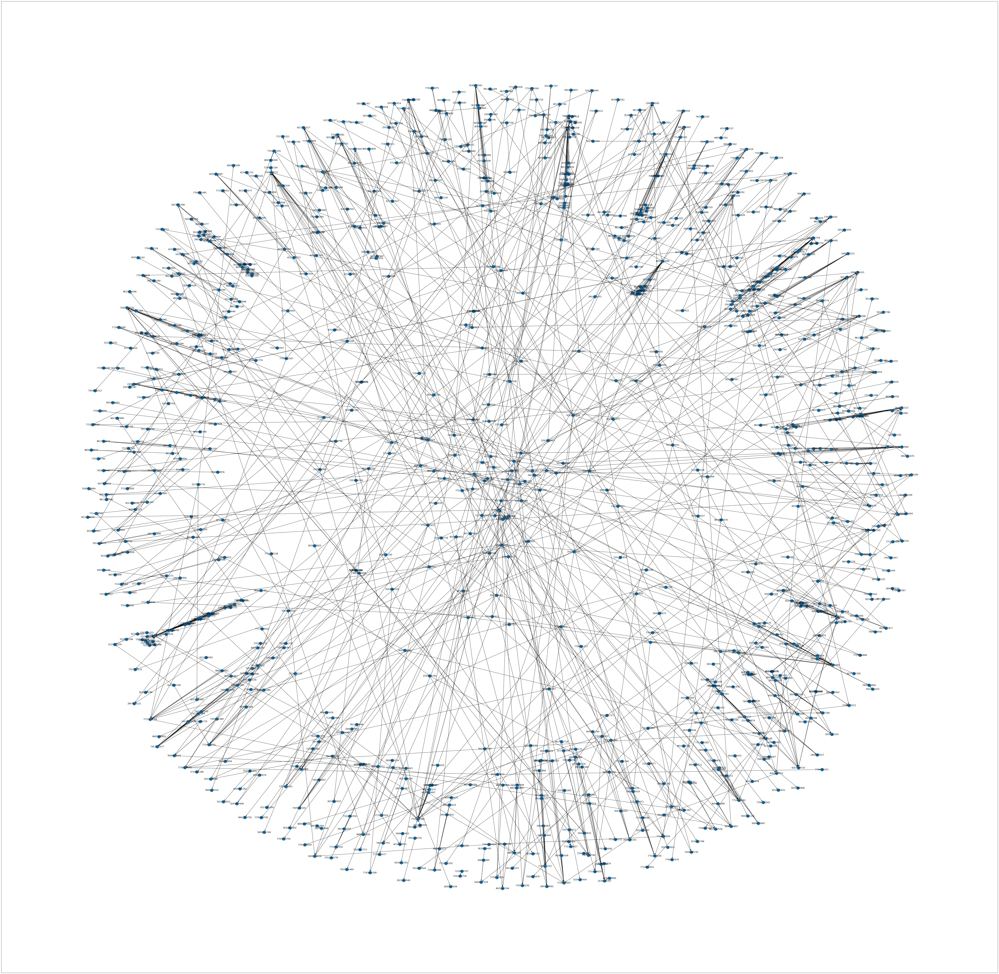

In [88]:
plt.figure(figsize=(100, 100))
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, with_labels=True)
plt.show()

Преобразуем наш граф в dgl graph.

In [90]:
g = dgl.from_networkx(G, node_attrs=['feat'])

Для создания train и test выборок, нам нужно получить вершины u и v и матрицу смежности графа. \
pos - вершины, соединенные ребрами \
neg - вершины, не соединенные ребрами

In [91]:
u, v = g.edges()
eids = np.arange(g.number_of_edges())
eids = np.random.permutation(eids)

test_size = int(len(eids) * 0.1)
train_size = g.number_of_edges() - test_size

test_pos_u, test_pos_v = u[eids[:test_size]], v[eids[:test_size]]
train_pos_u, train_pos_v = u[eids[test_size:]], v[eids[test_size:]] 

In [92]:
adj = g.adjacency_matrix(scipy_fmt='coo')
adj_neg = 1 - adj.todense() - np.eye(g.number_of_nodes())

In [93]:
neg_u, neg_v = np.where(adj_neg != 0)

neg_eids = np.random.choice(len(neg_u), g.number_of_edges() // 2)

test_neg_u, test_neg_v = neg_u[neg_eids[:test_size]], neg_v[neg_eids[:test_size]]
train_neg_u, train_neg_v = neg_u[neg_eids[test_size:]], neg_v[neg_eids[test_size:]]

Теперь создадим train и test графы:

In [94]:
train_g = dgl.remove_edges(g, eids[:test_size])
test_g = dgl.remove_edges(g, eids[test_size:])

In [95]:
train_pos_g = dgl.graph((train_pos_u, train_pos_v), num_nodes=g.number_of_nodes())
train_neg_g = dgl.graph((train_neg_u, train_neg_v), num_nodes=g.number_of_nodes())

test_neg_g = dgl.graph((test_neg_u, test_neg_v), num_nodes=g.number_of_nodes())
test_pos_g = dgl.graph((test_pos_u, test_pos_v), num_nodes=g.number_of_nodes())

## Создание модели

Мы будем строить модели *GraphSAGE* с разным количеством слоев, чтобы сравнить их и выбрать самую оптимальную. Последний слой (sigmoid) будет оставаться неизменным, так как там нужно получить вероятности. \
DGL предоставляет *dgl.nn.SAGEConv*, с помощью которого будем создавать слои *GraphSAGE*. \
Для сравнения будем использовать метрики качества, такие как ROC-AUC и F1 score, но в большей степени опираться будем на AUC.

In [96]:
class DotPredictor(nn.Module):
    def forward(self, g, h):
        with g.local_scope():
            g.ndata['h'] = h
            g.apply_edges(fn.u_dot_v('h', 'h', 'score'))
            return g.edata['score'][:, 0]

In [97]:
def compute_loss(pos_score, neg_score):
    scores = torch.cat([pos_score, neg_score])
    labels = torch.cat([torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])])
    return F.mse_loss(scores, labels)

**Модель № 1**

Построим двухслойную нейронную сеть, на первом слое функция активации - leaky_relu, а на втором - сигмоида.

In [114]:
class GraphSAGE(nn.Module):
    def __init__(self, in_feats, h_feats):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_feats, h_feats, 'lstm')
        self.conv2 = SAGEConv(h_feats, 1, 'lstm')

    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.leaky_relu(h)
        h = self.conv2(g, h)
        h = torch.sigmoid(h)
        return h

In [118]:
%%time
model1 = GraphSAGE(train_g.ndata['feat'].shape[1], 8)
pred1 = DotPredictor()

optimizer = torch.optim.RMSprop(itertools.chain(model1.parameters(), pred1.parameters()), lr=0.001)

epoch = 50


for e in range(epoch + 1):
    h = model1(train_g, train_g.ndata['feat'])
    pos_score = pred1(train_pos_g, h)
    neg_score = pred1(train_neg_g, h)
    loss = compute_loss(pos_score, neg_score)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if e % 5 == 0:
        with torch.no_grad():
            pos_score_test = pred1(test_pos_g, h)
            neg_score_test = pred1(test_neg_g, h)
            
            pos_score_train = pred1(train_pos_g, h)
            neg_score_train = pred1(train_neg_g, h)
            
            scores_test = torch.cat([pos_score_test, neg_score_test]).detach().numpy()
            labels_test = torch.cat([torch.ones(pos_score_test.shape[0]), torch.zeros(neg_score_test.shape[0])]).numpy()
            
            scores_train = torch.cat([pos_score_train, neg_score_train]).detach().numpy()
            labels_train = torch.cat([torch.ones(pos_score_train.shape[0]), torch.zeros(neg_score_train.shape[0])]).numpy()
            
            print('In epoch {}, loss: {}, test auc: {}, train auc: {}, f1: {}'\
                  .format(e, loss.item(), 
                          roc_auc_score(labels_test, scores_test),
                          roc_auc_score(labels_train, scores_train),
                          f1_score(labels_test, scores_test.round(), average='weighted')))

In epoch 0, loss: 0.3973320424556732, test auc: 0.45980978032152175, train auc: 0.503029860976039, f1: 0.4105361305361306
In epoch 5, loss: 0.23074182868003845, test auc: 0.6469994108240048, train auc: 0.6738575212796503, f1: 0.6014455782312926
In epoch 10, loss: 0.2108609974384308, test auc: 0.6560053867519569, train auc: 0.7033653801624571, f1: 0.5985267034990793
In epoch 15, loss: 0.20027443766593933, test auc: 0.6707347866341216, train auc: 0.7219335537710597, f1: 0.5862836201819253
In epoch 20, loss: 0.19206883013248444, test auc: 0.6853800185169598, train auc: 0.7381433678809266, f1: 0.5718415535694583
In epoch 25, loss: 0.185895174741745, test auc: 0.7007827623937378, train auc: 0.7556255615141665, f1: 0.5661211853162318
In epoch 30, loss: 0.18105243146419525, test auc: 0.7096204023230368, train auc: 0.7729607194791002, f1: 0.5757629367536489
In epoch 35, loss: 0.17713025212287903, test auc: 0.7169430182644558, train auc: 0.7878228995896894, f1: 0.5545486851457001
In epoch 40, l

**Время**, затраченное на обучение модели - 18.6 сек.

F1 0.5359601449275362
AUC 0.7293157141654744


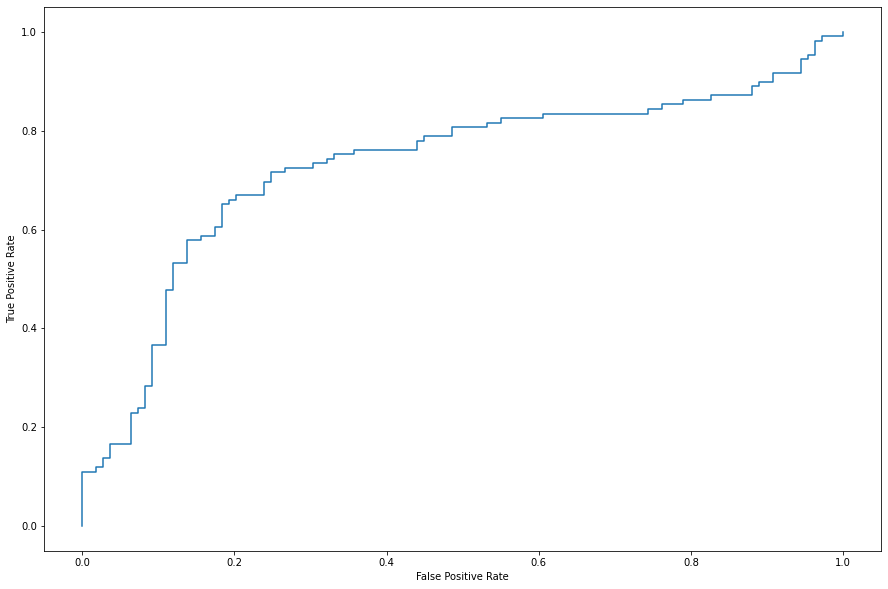

In [119]:
with torch.no_grad():
    pos_score = pred1(test_pos_g, h)
    neg_score = pred1(test_neg_g, h)
    scores = torch.cat([pos_score, neg_score]).detach().numpy()
    labels = torch.cat([torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]).numpy()
    print('F1', f1_score(labels, scores.round(), average='weighted'))
    print('AUC', roc_auc_score(labels, scores))
    fpr, tpr, _ = roc_curve(labels, scores)

    plt.figure(figsize=(15, 10))
    plt.plot (fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show() 

In [120]:
torch.save(model1, 'model1.pth')
torch.save(pred1, 'pred1.pth')

**Модель № 2**

In [121]:
class GraphSAGE(nn.Module):
    def __init__(self, in_feats, h_feats):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_feats, h_feats, 'lstm')
        self.conv2 = SAGEConv(h_feats, h_feats, 'lstm')
        self.conv3 = SAGEConv(h_feats, 1, 'lstm')

    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.relu(h)
        h = nn.Dropout(0.5)(h)
        h = self.conv2(g, h)
        h = F.relu(h)
        h = nn.Dropout(0.5)(h)
        h = self.conv3(g, h)
        h = torch.sigmoid(h)
        return h

In [122]:
%%time
model2 = GraphSAGE(train_g.ndata['feat'].shape[1], 8)
pred2 = DotPredictor()

optimizer = torch.optim.RMSprop(itertools.chain(model2.parameters(), pred2.parameters()), lr=0.08)

epoch = 100


for e in range(epoch + 1):
    h = model2(train_g, train_g.ndata['feat'])
    pos_score = pred2(train_pos_g, h)
    neg_score = pred2(train_neg_g, h)
    loss = compute_loss(pos_score, neg_score)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if e % 10 == 0:
        with torch.no_grad():
            pos_score_test = pred2(test_pos_g, h)
            neg_score_test = pred2(test_neg_g, h)
            
            pos_score_train = pred2(train_pos_g, h)
            neg_score_train = pred2(train_neg_g, h)
            
            scores_test = torch.cat([pos_score_test, neg_score_test]).detach().numpy()
            labels_test = torch.cat([torch.ones(pos_score_test.shape[0]), torch.zeros(neg_score_test.shape[0])]).numpy()
            
            scores_train = torch.cat([pos_score_train, neg_score_train]).detach().numpy()
            labels_train = torch.cat([torch.ones(pos_score_train.shape[0]), torch.zeros(neg_score_train.shape[0])]).numpy()
            
            print('In epoch {}, loss: {}, test auc: {}, train auc: {}, f1: {}'\
                  .format(e, loss.item(), 
                          roc_auc_score(labels_test, scores_test),
                          roc_auc_score(labels_train, scores_train),
                          f1_score(labels_test, scores_test.round(), average='weighted')))

In epoch 0, loss: 0.6035510897636414, test auc: 0.5897651712818786, train auc: 0.49708244185723416, f1: 0.360913997643771
In epoch 10, loss: 0.21288880705833435, test auc: 0.5892180792862554, train auc: 0.586149008493336, f1: 0.5852359208523592
In epoch 20, loss: 0.19345487654209137, test auc: 0.6962797744297617, train auc: 0.6695992757046133, f1: 0.6680569347898047
In epoch 30, loss: 0.18717175722122192, test auc: 0.6431697668546419, train auc: 0.7023176063056306, f1: 0.3333333333333333
In epoch 40, loss: 0.18489225208759308, test auc: 0.6911034424711725, train auc: 0.7130187927792752, f1: 0.4660505517258794
In epoch 50, loss: 0.1827373504638672, test auc: 0.776365625789075, train auc: 0.7215688590032138, f1: 0.5404809811248443
In epoch 60, loss: 0.18096786737442017, test auc: 0.7596161939230706, train auc: 0.7355326164476184, f1: 0.5230676764034138
In epoch 70, loss: 0.17972946166992188, test auc: 0.7352074741183403, train auc: 0.7435072753711782, f1: 0.5123042505592842
In epoch 80, 

**Время** обучения 53.3 сек.

F1 0.5505154639175258
AUC 0.8183233734534131


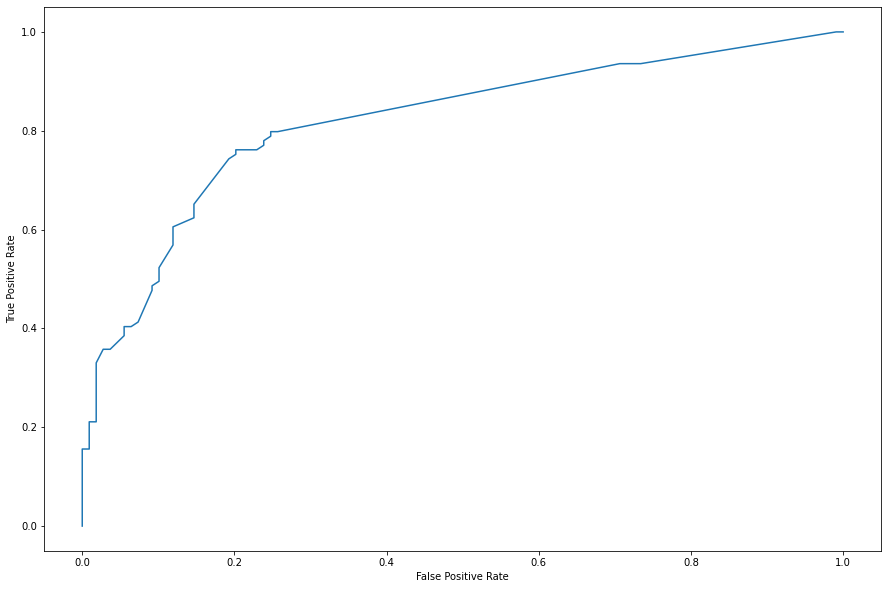

In [123]:
with torch.no_grad():
    pos_score = pred2(test_pos_g, h)
    neg_score = pred2(test_neg_g, h)
    scores = torch.cat([pos_score, neg_score]).detach().numpy()
    labels = torch.cat([torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]).numpy()
    print('F1', f1_score(labels, scores.round(), average='weighted'))
    print('AUC', roc_auc_score(labels, scores))
    fpr, tpr, _ = roc_curve(labels, scores)

    plt.figure(figsize=(15, 10))
    plt.plot (fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show() 

In [124]:
torch.save(model2, 'model2.pth')
torch.save(pred2, 'pred2.pth')

**Модель № 3**

In [125]:
class GraphSAGE(nn.Module):
    def __init__(self, in_feats, h_feats):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_feats, h_feats, 'lstm')
        self.conv2 = SAGEConv(h_feats, 100, 'lstm')
        self.conv3 = SAGEConv(100, h_feats, 'lstm')
        self.conv4 = SAGEConv(h_feats, 1, 'lstm')

    def forward(self, g, in_feat):
        h = self.conv1(g, in_feat)
        h = F.relu(h)
        h = nn.Dropout(0.5)(h)
        h = self.conv2(g, h)
        h = F.relu(h)
        h = nn.Dropout(0.5)(h)
        h = self.conv3(g, h)
        h = F.relu(h)
        h = nn.Dropout(0.5)(h)
        h = self.conv4(g, h)
        h = torch.sigmoid(h)
        return h

In [127]:
%%time
model3 = GraphSAGE(train_g.ndata['feat'].shape[1], 32)
pred3 = DotPredictor()

optimizer = torch.optim.RMSprop(itertools.chain(model3.parameters(), pred3.parameters()), lr=0.003)

epoch = 60


for e in range(epoch + 1):
    h = model3(train_g, train_g.ndata['feat'])
    pos_score = pred3(train_pos_g, h)
    neg_score = pred3(train_neg_g, h)
    loss = compute_loss(pos_score, neg_score)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if e % 5 == 0:
        with torch.no_grad():
            pos_score_test = pred3(test_pos_g, h)
            neg_score_test = pred3(test_neg_g, h)
            
            pos_score_train = pred3(train_pos_g, h)
            neg_score_train = pred3(train_neg_g, h)
            
            scores_test = torch.cat([pos_score_test, neg_score_test]).detach().numpy()
            labels_test = torch.cat([torch.ones(pos_score_test.shape[0]), torch.zeros(neg_score_test.shape[0])]).numpy()
            
            scores_train = torch.cat([pos_score_train, neg_score_train]).detach().numpy()
            labels_train = torch.cat([torch.ones(pos_score_train.shape[0]), torch.zeros(neg_score_train.shape[0])]).numpy()
            
            print('In epoch {}, loss: {}, test auc: {}, train auc: {}, f1: {}'\
                  .format(e, loss.item(), 
                          roc_auc_score(labels_test, scores_test),
                          roc_auc_score(labels_train, scores_train),
                          f1_score(labels_test, scores_test.round(), average='weighted')))

In epoch 0, loss: 0.5188981890678406, test auc: 0.4401986364784109, train auc: 0.49114775811127476, f1: 0.40528094105869106
In epoch 5, loss: 0.23633523285388947, test auc: 0.574025755407794, train auc: 0.5875591615956728, f1: 0.4837780436003221
In epoch 10, loss: 0.21617034077644348, test auc: 0.5878293072973656, train auc: 0.6202473904063279, f1: 0.5086325084233764
In epoch 15, loss: 0.1986357718706131, test auc: 0.6319333389445332, train auc: 0.6714146452156677, f1: 0.5807692307692309
In epoch 20, loss: 0.18767453730106354, test auc: 0.6535645147714839, train auc: 0.7169875980623709, f1: 0.6169234928359015
In epoch 25, loss: 0.18363679945468903, test auc: 0.6900934264792528, train auc: 0.7367829985088037, f1: 0.589490674318508
In epoch 30, loss: 0.18159489333629608, test auc: 0.7004460903964314, train auc: 0.7511577611677641, f1: 0.6499131944444445
In epoch 35, loss: 0.17903898656368256, test auc: 0.7046544903627641, train auc: 0.7618253725675438, f1: 0.6069274091222759
In epoch 40,

**Время** обучения 47.8 сек.

F1 0.5716318464144552
AUC 0.7476643380186854


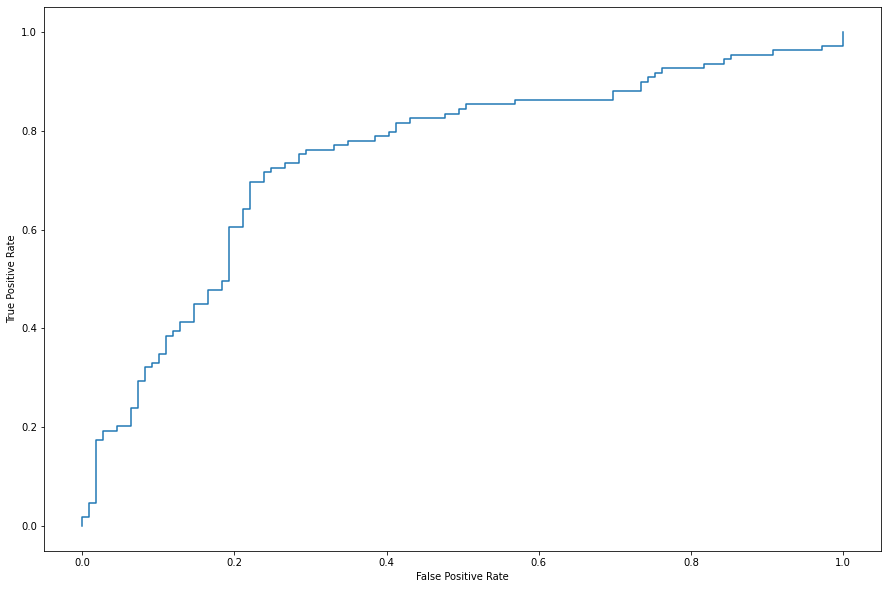

In [128]:
with torch.no_grad():
    pos_score = pred3(test_pos_g, h)
    neg_score = pred3(test_neg_g, h)
    scores = torch.cat([pos_score, neg_score]).detach().numpy()
    labels = torch.cat([torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]).numpy()
    print('F1', f1_score(labels, scores.round(), average='weighted'))
    print('AUC', roc_auc_score(labels, scores))
    fpr, tpr, _ = roc_curve(labels, scores)

    plt.figure(figsize=(15, 10))
    plt.plot (fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show() 

In [129]:
torch.save(model3, 'model3.pth')
torch.save(pred3, 'pred3.pth')

In [133]:
f1 = np.array([])
auc = np.array([])
for i in [(model1, pred1), (model2, pred2), (model3, pred3)]:
    h = i[0](train_g, train_g.ndata['feat'])
    pos_score = i[1](test_pos_g, h)
    neg_score = i[1](test_neg_g, h)
    scores = torch.cat([pos_score, neg_score]).detach().numpy()
    labels = torch.cat([torch.ones(pos_score.shape[0]), torch.zeros(neg_score.shape[0])]).numpy()
    f1 = np.append(f1, f1_score(labels, scores.round(), average='weighted'))
    auc = np.append(auc, roc_auc_score(labels, scores))

In [134]:
pd.DataFrame({'ROC-AUC': auc, 'Gini coef': 2*auc - 1, 'F1 score': f1}, index=['Модель 1', 'Модель 2', 'Модель 3'])

,ROC-AUC,Gini coef,F1 score
Модель 1,0.730242,0.460483,0.529778
Модель 2,0.801153,0.602306,0.333333
Модель 3,0.788738,0.577477,0.636044


**Итог** \
На мой взгляд вторая модель показала лучший результат и  не переобучилась. Для построения рекомендательной системы мы будем использовать именно её.

## Рекомендательная система

Чтобы удобнее было использовать рекомендательную систему, спарсим названия компаний по их ИНН.

In [135]:
companies = pd.DataFrame(set(final_dataset['ИНН поставщика']) | set(final_dataset['ИНН заказчика']), columns = ['ИНН'])
companies

,ИНН
0,6670381056
1,3234013184
2,1644040195
3,2536038419
4,4217102358
...,...
1018,7707279342
1019,3128115184
1020,7805018099
1021,7709007859


In [136]:
def parsing_name_of_company(num_tin, df_tin):
    url_tin = f'https://companies.rbc.ru/search/?query={num_tin}'
    ua = UserAgent(browsers=['chrome'])
    headers = {"User-Agent": ua.random}
    
    response_tin = requests.get(url_tin, headers=headers)
    soup = BeautifulSoup(response_tin.text, "lxml")
    
    name = None
    if soup.find("a", class_="company-name-highlight") != None:
        name = soup.find("a", class_="company-name-highlight").text
      
    dict_data = pd.DataFrame({'ИНН': [num_tin], 'Название компании': [name]})
    
    df_tin = pd.concat([df_tin, dict_data], ignore_index=True)
    
    return df_tin

In [138]:
df_companies = pd.DataFrame(columns=['ИНН', 'Название компании'])

for num_tin in tqdm(companies['ИНН'].unique()):
    df_companies = parsing_name_of_company(num_tin, df_companies)
    sleep(0.0001)

100%|██████████████████████████████████████████████████████████████████████████████| 1023/1023 [05:05<00:00,  3.35it/s]


**Время**, затраченное на парсинг названий компаний: 5 мин. 5 сек.

In [143]:
df_companies

,ИНН,Название компании
0,6670381056,"ООО ""ЕКАТЕРИНБУРГ ЯБЛОКО"""
1,3234013184,"ГАУЗ ""БООД"""
2,1644040195,"ООО ""ТАТНЕФТЬ-АЗС ЦЕНТР"""
3,2536038419,"КГА ПОУ ""ЭНЕРГЕТИЧЕСКИЙ КОЛЛЕДЖ"""
4,4217102358,"АО ""НХС"""
...,...,...
1018,7707279342,"ООО ""МЕРСЕДЕС-БЕНЦ ФАЙНЕНШЛ СЕРВИСЕС РУС"""
1019,3128115184,"МАУ ТЦ ""ТЕНХАУС"""
1020,7805018099,"ООО ""ГАЗПРОМ ТРАНСГАЗ САНКТ-ПЕТЕРБУРГ"""
1021,7709007859,"ФГУП ""ФТ-ЦЕНТР"""


Построим функцию, принимающую на вход все параметры, которые можно добавить как фичи, но параметры, определяющие фичи исполнителей контрактов, будут по умолчанию 0, отношение к классу "заказчик" - единицей, а количество рекомендованных имполнителей - 1.

In [162]:
def recommendation(price, time, okpd2, сount = 1, supplier = 0,
                   purchaser = 1, revenue = 0, growth_rate = 0, authorized_capital=0, 
                   df_nodes = df_nodes, df_companies = df_companies):

    # Создаем фичи для вершины графа
    node_feat = np.array([authorized_capital, revenue, growth_rate,
                          price, price, price, price, price,
                          time, time, time, time, time,
                          supplier, purchaser])
    
    okpd2_f = onehotencoder.transform(pd.DataFrame(data=[okpd2]))
    okpd2_f = pd.DataFrame(okpd2_f.toarray(), columns=onehotencoder.categories_[0])
    node_feat = np.append(node_feat, okpd2_f)
    
    
    node_mean=np.array(df_nodes.drop(['ИНН', 'Ребра'], axis=1).mean())
    node_std=np.array(df_nodes.drop(['ИНН', 'Ребра'], axis=1).std())
    
    node_feat = (node_feat - node_mean) / node_std
    node_feat = node_feat.astype(np.float32)
    node_feat = torch.from_numpy(node_feat)
    node_feat = node_feat.unsqueeze(0)

    # Строим граф
    RG = nx.DiGraph()

    RG.add_nodes_from(df_nodes['ИНН'])

    for i in range(len(df_nodes)):
        RG.nodes[df_nodes['ИНН'][i]]['feat'] = features[i]

    rg = dgl.from_networkx(RG, node_attrs=['feat'])

    rg.add_nodes(1, {'feat': node_feat})

    # Добавляем новые ребра
    new_edges = []

    if supplier:
        for i in range(rg.number_of_nodes() - 1):
            new_edges.append((i, rg.number_of_nodes() - 1))
    
    if purchaser:
        for i in range(rg.number_of_nodes() - 1):
            new_edges.append((rg.number_of_nodes() - 1, i))
        
    new_edges = np.array(new_edges)
    rg.add_edges(new_edges[:, 0], new_edges[:, 1])
    
    # Применяем нашу модель
    h = model2(rg, rg.ndata['feat'])
    pos_score = pred2(rg, h)
    pos_score = pos_score.detach().numpy()

    сount = np.argsort(pos_score)[-сount:]
    сount = сount[::-1]

    сount_TIN = []
    count_companies = []
    for i in сount:
        сount_TIN.append(df_nodes['ИНН'][i])
        count_companies.append(df_companies['Название компании'][i])
    print(f'Для контракта с ценой {price} руб., временем выполнения {time} дней(дня) и ОКПД2 = {okpd2} Вам рекомендованы следующие исполнители: \n\
{count_companies} (ИНН: {сount_TIN})')

In [187]:
recommendation(price = 1_000_000, time = 3, okpd2 = '72')

Для контракта с ценой 1000000 руб., временем выполнения 3 дней(дня) и ОКПД2 = 72 Вам рекомендованы следующие исполнители: 
['ФГУП "РОСМОРПОРТ"'] (ИНН: [7702352454])


In [188]:
df_nodes[df_nodes['ИНН'] == 7702352454].iloc[:, :17]

,ИНН,Ребра,Уставной капитал,Выручка,Темп прироста %,Цена sum,Цена mean,Цена max,Цена min,Цена median,Время sum,Время mean,Время max,Время min,Время median,Поставщик,Заказчик
141,7702352454,[],1.212243e+11,3.442041e+10,20.7,79009409.15,4.938088e+06,29700000.0,0.11,499999.0,63.0,3.9375,71.0,-25.0,0.0,1.0,0.0


In [179]:
recommendation(price = 1_000_000, time = 3, okpd2 = '72', сount = 3, supplier = 1, purchaser = 0)

Для контракта с ценой 1000000 руб., временем выполнения 3 дней(дня) и ОКПД2 = 72 Вам рекомендованы следующие исполнители: 
['БУЗОО "КПБ ИМ. Н.Н. СОЛОДНИКОВА"', 'АМУ "КДЦ "ЮЖНЫЙ"', 'ГБУ РО "СП" В АКСАЙСКОМ РАЙОНЕ'] (ИНН: [5504004973, 4703077727, 6102005111])


In [180]:
df_nodes[(df_nodes['ИНН'] == 5504004973) | (df_nodes['ИНН'] == 4703077727) | (df_nodes['ИНН'] == 6102005111)].iloc[:, :17]

,ИНН,Ребра,Уставной капитал,Выручка,Темп прироста %,Цена sum,Цена mean,Цена max,Цена min,Цена median,Время sum,Время mean,Время max,Время min,Время median,Поставщик,Заказчик
213,5504004973,[7709678550],0.0,0.0,0.0,195990.0,195990.0,195990.0,195990.0,195990.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
354,4703077727,[7804069580],0.0,0.0,0.0,623023.3,623023.3,623023.3,623023.3,623023.3,0.0,0.0,0.0,0.0,0.0,0.0,1.0
363,6102005111,[6168002922],0.0,0.0,0.0,822432.0,822432.0,822432.0,822432.0,822432.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0


## Выводы

Мы спарсили данные с сайтов, собрали наш датасет, адаптировали его под граф и сделали 3 модели. Как итоговую мы взяли вторую трехслойную модель. Архитектура модели представлена ниже:

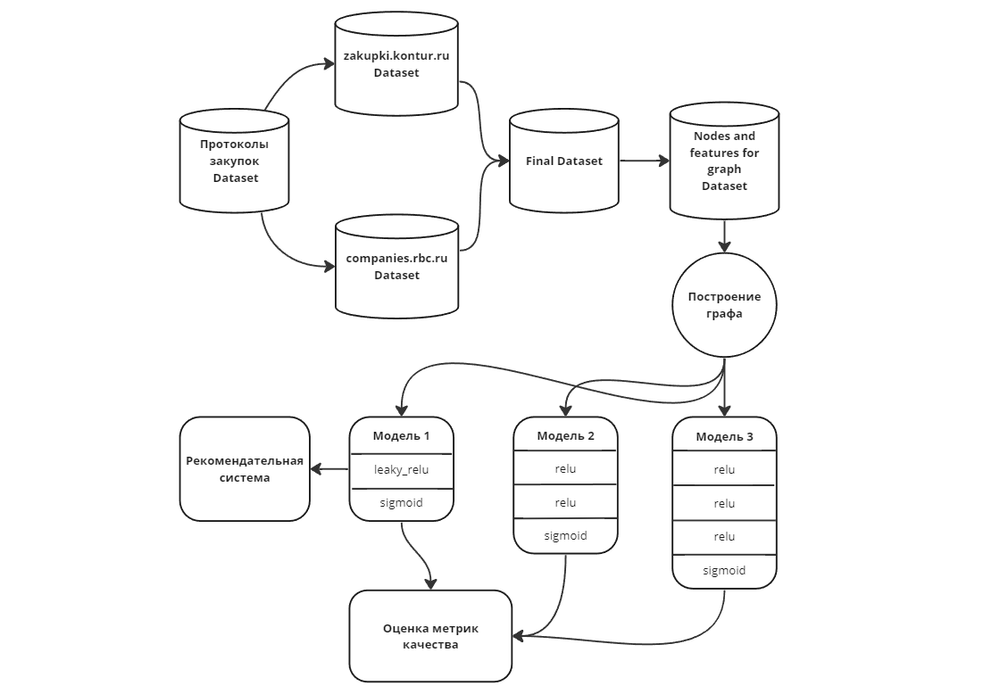

Таким образом, мы сделали рекомендательную систему для рекомендации исполнителей с учетом цены и времени исполнения контракта.